In [1]:
import scanpy as sc
import spatialdata

#sdata = spatialdata.read_zarr("/Volumes/DATA_2025/Projects/RAO/dbs/Xenium_and_AdjustedPhenoCycler.V7.zarr")
#adata = sdata.tables["GeneTranscripts_XStock_PhenCyc_Props"]

Tissue = "Region1"
TableFolder = "REGION1_TABLES"
in_out_path = f"/Volumes/ProstateCancerEvo_SpatialAnalysis/dbs/Ongoing/{Tissue}/{TableFolder}"

adata_xenium_p = f"{in_out_path}/{Tissue}_Xenium_Phen_HE_Integrated.Xenium_Process_Table.V2.h5ad"
adata = sc.read_h5ad(adata_xenium_p)

outfile = adata_xenium_p.replace(".V2",".Cell_Type_Annotated.V3")


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.5 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/Users/ugursahin/miniforge3/envs/ScanPy/lib/python3.11/site-packages/ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "/Users/ugursahin/miniforge3/envs/ScanPy/lib/python3.11/site-packages/traitlets/config/application.py", line 1075, in launch_instance
    app.start()
  File "/Users/ugursahin/miniforge3/envs/ScanPy/lib/python3.11/site-packages/ipykernel/kernelapp.py", line 739, in

In [2]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib as mpl

# 1. Build your DataFrame as before
df = pd.DataFrame(
    adata.obsm['X_umap'],
    columns=['UMAP1', 'UMAP2'],
    index=adata.obs_names
).copy()

df['leiden'] = adata.obs['leiden'].astype(str)

# 2. Grab the Matplotlib Tab20 palette and convert to hex
tab20 = [mpl.colors.rgb2hex(c) for c in plt.get_cmap('tab20').colors]

# 3. Plot with Plotly Express
fig = px.scatter(
    df,
    x='UMAP1',
    y='UMAP2',
    color='leiden',
    title='UMAP embedding — Leiden clusters',
    color_discrete_sequence=tab20,
    hover_name=df.index,
    width=1400,
    height=1200
)

fig.update_traces(marker=dict(size=3, opacity=0.8))
fig.update_layout(
    legend_title_text='Leiden cluster',
    legend=dict(
        itemsizing='constant',
        traceorder='normal',
        bgcolor='rgba(255,255,255,0.5)',
        x=1.02, y=1
    ),
    margin=dict(l=20, r=200, t=50, b=20)
)

fig.show()

In [38]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib as mpl

df = pd.DataFrame(
    adata.obsm['X_umap'],
    columns=['UMAP1', 'UMAP2'],
    index=adata.obs_names
).copy()

df['cell_type'] = adata.obs['cell_type'].astype(str)

tab20 = [mpl.colors.rgb2hex(c) for c in plt.get_cmap('tab20').colors]

fig = px.scatter(
    df,
    x='UMAP1',
    y='UMAP2',
    color='cell_type',
    title='UMAP embedding — Leiden clusters',
    color_discrete_sequence=tab20,
    hover_name=df.index,
    width=1400,
    height=1200
)

fig.update_traces(marker=dict(size=3, opacity=0.8))
fig.update_layout(
    legend_title_text='Leiden cluster',
    legend=dict(
        itemsizing='constant',
        traceorder='normal',
        bgcolor='rgba(255,255,255,0.5)',
        x=1.02, y=1
    ),
    margin=dict(l=20, r=200, t=50, b=20)
)

fig.show()

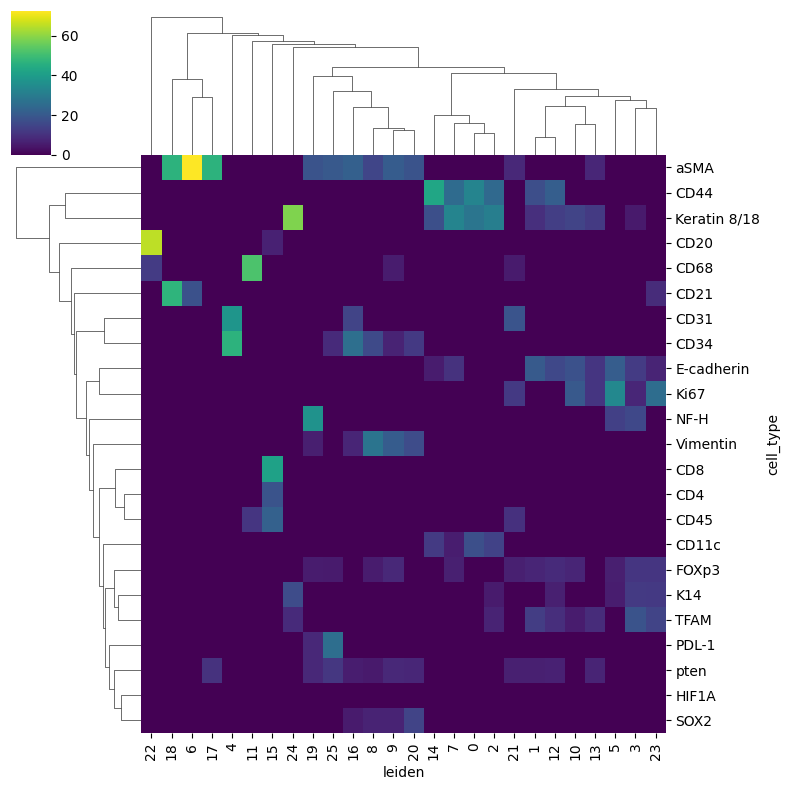

In [54]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster import hierarchy
from scipy.spatial.distance import pdist
import matplotlib.gridspec as gridspec
import seaborn as sns

# 1. Your original crosstab
ct = pd.crosstab(index=adata.obs['leiden'], columns=adata.obs['cell_type'], dropna=False)

# 2. Transpose
ct_t = ct.T
# Normalize so each column sums to 1
ct_norm = ct.div(ct.sum(axis=1), axis=0)

# If you prefer percentages:
ct_pct = ct_norm * 100
ct_pct[ct_pct <5] = 0

sns.clustermap(ct_pct.T,
               metric='euclidean',
               method='average',
               cmap='viridis',
               figsize=(8,8))
plt.show()

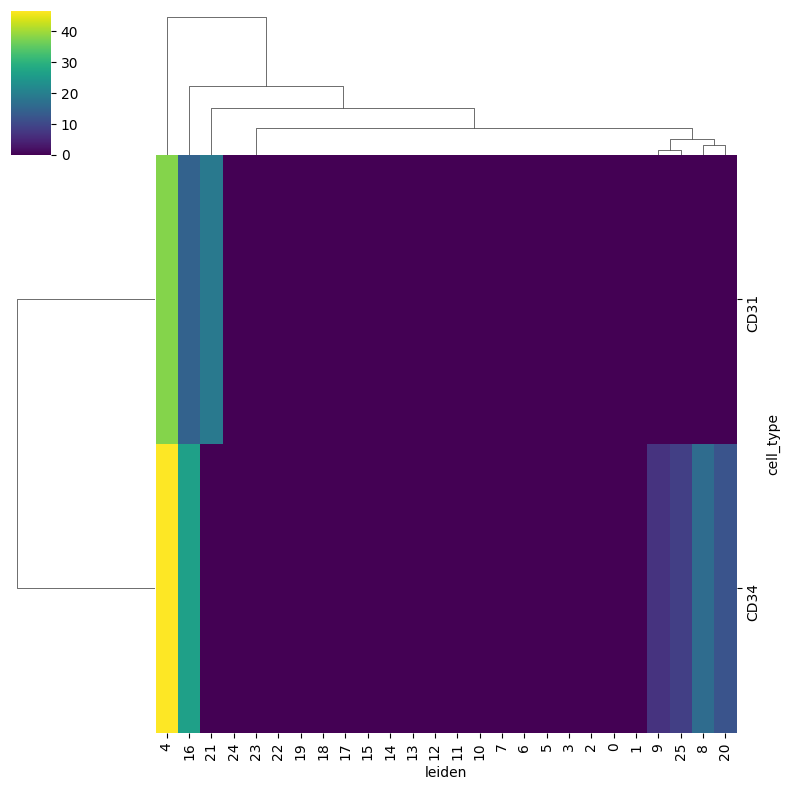

In [39]:
#Immune Targeted 
Immune = ["CD45", "CD4", "CD8", "CD20", "CD21", "CD11c", "CD68", "FOXp3"]
Stromal_Mesenchymal = ["Vimentin","aSMA"] 
Epithelial = ["E-cadherin", "Keratin 8/18", "K14", "SOX2","Ki67","CD44"]
Endothelial = ["CD31", "CD34"]


ct_pct_target = ct_pct.T.loc[Endothelial]

sns.clustermap(ct_pct_target,
               metric='euclidean',
               method='average',
               cmap='viridis',
               figsize=(8,8))
plt.show()

In [48]:
Manuel_Annotation = {

"22":"premature_B_Cells_CD20",
"11":"CD68_Monocytes_has_CD34_AND_T_Cells",
"15":"CD8_Effector_AND_CD4_Helper_CD45_PanMarker",
"18":"Smooth_Muscle_Cells_5",
"6":"Smooth_Muscle_Cells_1",
"17":"Smooth_Muscle_Cells_2",

"25":"Smooth_Muscle_Cells_3",

"5":"Tumor_1",
"3":"Tumor_2",
"23":";Tumor_3",
"10":"Progenitor_Stem_Cells_Unsure",
"24":"Luminal_Epithelia_1",
"14":"Luminal_Epithelia_2",
"7":"Luminal_Epithelia_3",
"2":"Luminal_Epithelia_4",
"12":"Luminal_Epithelia_5",
"1":"Luminal_Epithelia_6",
"0":"Luminal_Epithelia_7",

"4":"Progenitor",
"21":"Endothelial_Vascular_2",
"13":"Fibroblast_OR_Progenitor_Stem_Cells",
"19":"Glandular_Epithelia",


"8":"Myo_fibroflast_Progenitor_1",
"9":"Myo_fibroflast_Progenitor_2",
"16":"Myo_fibroflast_Progenitor_3",
"20":"Myo_fibroflast_Progenitor_4",

}


import pandas as pd

# 1) Build your manual cell_type mapping
adata.obs['cell_type_manuel'] = (
    adata.obs['leiden'].astype(str)
              .map(Manuel_Annotation)
)
adata.obs['cell_type_manuel'] = pd.Categorical(
    adata.obs['cell_type_manuel'],
    categories=list(Manuel_Annotation.values())
)

In [26]:
len(Manuel_Annotation.keys())

23

In [27]:
sorted(Manuel_Annotation.keys())

['10',
 '11',
 '13',
 '14',
 '15',
 '16',
 '17',
 '18',
 '19',
 '2',
 '20',
 '21',
 '22',
 '23',
 '24',
 '25',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9']

/Users/ugursahin/miniforge3/envs/ScanPy/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:803: UserWarning:

Attempting to set identical low and high ylims makes transformation singular; automatically expanding.



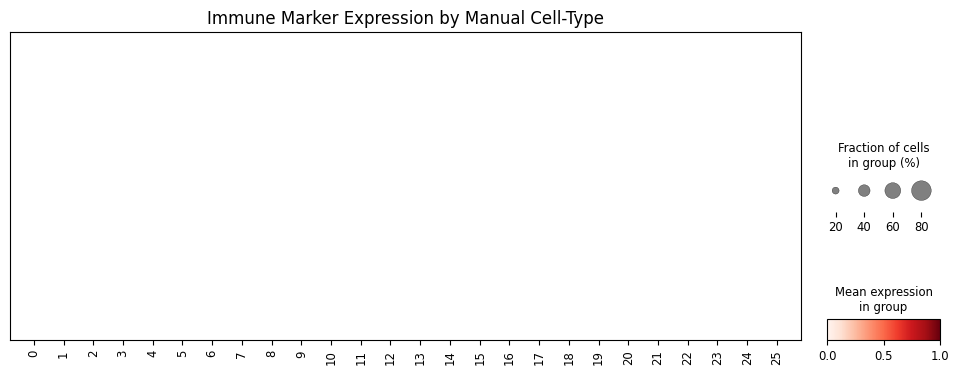

In [ ]:
import scanpy as sc


tumor_cell_markers = [
    'AMACR',    # α-methylacyl-CoA racemase – prostate carcinoma
    'PCA3',     # prostate cancer antigen 3 (lncRNA)
    'FOLH1',    # PSMA – prostate-specific membrane antigen
    'ERG',      # ETS fusion oncogene (TMPRSS2-ERG)
    'SPINK1',   # serine protease inhibitor – non-ERG PCa
    'MKI67',    # proliferation marker Ki-67
    'TOP2A',    # topoisomerase II alpha – cell cycle
    'PCNA',     # proliferating cell nuclear antigen
    'AR',       # androgen receptor – prostate lineage oncogene
    'MYC'       # oncogenic transcription factor
]

smooth_muscle_markers = [
    'ACTA2',   # α-smooth muscle actin
    'MYH11',   # smooth muscle myosin heavy chain
    'CNN1',    # calponin 1
    'TAGLN',   # transgelin (SM22α)
    'SMTN',    # smoothelin
    'CALD1',   # caldesmon 1
    'MYLK'     # myosin light chain kinase
]


# Define your 5 immune‐related genes
fibroblast_exclusive_markers = [
    'PDGFRA',   # platelet-derived growth factor receptor alpha
    'PDGFRB',   # platelet-derived growth factor receptor beta
    'FAP',      # fibroblast activation protein
    'THY1',     # CD90, fibroblast surface glycoprotein
    'S100A4',   # fibroblast-specific protein 1 (FSP1)
    'DCN'       # decorin
]



present = [g for g in seminal_vesicle_epithelial_exclusive_markers if g in list(adata.var_names)]


# Create the dotplot
sc.pl.dotplot(
    adata,
    present,
    groupby='leiden',
    standard_scale='var',   # scale each gene to [0,1] across groups
    swap_axes=True,
    dendrogram=False,
    dot_max=0.8,
    figsize=(12, 4),
    title="Immune Marker Expression by Manual Cell‐Type"
)

In [46]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib as mpl

df = pd.DataFrame(
    adata.obsm['X_umap'],
    columns=['UMAP1', 'UMAP2'],
    index=adata.obs_names
).copy()

df['cell_type_manuel'] = adata.obs['cell_type_manuel'].astype(str)

tab20 = [mpl.colors.rgb2hex(c) for c in plt.get_cmap('tab20').colors]

fig = px.scatter(
    df,
    x='UMAP1',
    y='UMAP2',
    color='cell_type_manuel',
    title='UMAP embedding — Leiden clusters',
    color_discrete_sequence=tab20,
    hover_name=df.index,
    width=1400,
    height=1200
)

fig.update_traces(marker=dict(size=3, opacity=0.8))
fig.update_layout(
    legend_title_text='Leiden cluster',
    legend=dict(
        itemsizing='constant',
        traceorder='normal',
        bgcolor='rgba(255,255,255,0.5)',
        x=1.02, y=1
    ),
    margin=dict(l=20, r=200, t=50, b=20)
)

fig.show()

In [47]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib as mpl

# 1. Extract spatial coords (assuming your Squidpy/Scanpy store them in obsm['spatial'])
coords = adata.obsm['spatial'].copy()
df = pd.DataFrame(coords, columns=['x', 'y'], index=adata.obs_names)

# 2. Attach your manual cell‐type labels
df['cell_type_manuel'] = adata.obs['cell_type_manuel'].astype(str)

# 3. Build the Tab20 color list via Matplotlib
tab20 = [mpl.colors.rgb2hex(c) for c in plt.get_cmap('tab20').colors]

# 4. Create the Plotly scatter
fig = px.scatter(
    df,
    x='x',
    y='y',
    color='cell_type_manuel',
    title='Spatial scatter — manual cell types',
    color_discrete_sequence=tab20,
    hover_name=df.index,
    width=1600,
    height=700
)

# 5. Style markers & axes
fig.update_traces(marker=dict(size=2, opacity=0.8))
# Flip Y so (0,0) is top‐left like image coords
fig.update_yaxes(autorange='reversed')
fig.update_layout(
    legend_title_text='cell_type_manuel',
    legend=dict(
        itemsizing='constant',
        traceorder='normal',
        bgcolor='rgba(255,255,255,0.5)',
        x=1.02, y=1
    ),
    margin=dict(l=20, r=200, t=50, b=20)
)

fig.show()

In [61]:
# 1. Your original crosstab
ct = pd.crosstab(index=adata.obs['cell_type_manuel'], columns=adata.obs['cell_type'], dropna=False)

# 2. Transpose
ct_t = ct.T
# Normalize so each column sums to 1
ct_norm = ct.div(ct.sum(axis=1), axis=0)

# If you prefer percentages:
ct_pct = ct_norm * 100
ct_pct[ct_pct <5] = 0

ct_pct.index = ct_pct.index.astype(str) + f"_{Tissue}"
ct_pct.to_csv(outfile.replace(".h5ad",".crosstab.csv"))